In [1]:
import os, sys
import pandas as pd
from pandas import DataFrame
import numpy as np
from IPython.display import HTML, Image
import re

In [2]:
from test_partitions import get_last_testdir, set_test_dir, calc_scores, gather_outputs

In [3]:
# %load_ext autoreload
# %autoreload 2

In [4]:
if "testResults" not in os.listdir(os.curdir):
    rootdir = os.path.abspath("..")
    os.chdir(rootdir)
    set_test_dir(True)

In [5]:
scores_df = calc_scores()

Scores saved to testResults/ptest_2023-11-6_19-22-56/scores.csv


In [6]:
def highlight_min(s: pd.Series):
    sorted = s.sort_values(ascending=True)    
    styles = []
    for val in s:
        if val == sorted.iloc[0]:
            styles.append('background: darkgreen')
        elif val == sorted.iloc[1]:
            styles.append('background: darkblue')
        elif val == sorted.iloc[-1]:
            styles.append('background: #330000')
        else:
            styles.append('')
          
    return styles

scores_df.style.apply(
    highlight_min,
    subset=list(filter(lambda x: x != "name", scores_df.columns)), 
    axis=0,
)

,name,vnum_std,vnum_max_diff,stime_std,stime_max,ctime_std,ctime_max,tot_time,msgs_in_max,msgs_in_dvtn,msgs_out_max,msgs_out_dvtn,msgs_tot_sum,msgs_tot_dvtn
id,,,,,,,,,,,,,,
0,E: V:,19.081786,41.765557,0.689754,3.318000,0.787801,4.575000,8856.800000,2640,0.599901,2427,0.591428,13996,0.687762
1,E: V: connections,19.279089,40.109353,0.713097,3.055000,1.045433,4.926000,9078.350000,2705,0.587988,2449,0.591940,14886,0.675427
2,E: V: connexp,17.306231,37.659275,0.524290,3.011000,1.495725,5.706000,10023.200000,3342,0.718751,3281,0.715906,18522,0.818063
3,"E: V: connections,connexp",17.306231,37.659275,0.526545,2.990000,1.504889,5.736000,10028.500000,3342,0.718714,3281,0.715906,18522,0.817886
4,E: route-num V:,18.564194,39.318424,0.695055,3.152000,1.598874,5.901000,10061.400000,2412,0.579072,2252,0.569939,13624,0.660326
5,E: route-num V: connections,10.496657,23.268008,0.288387,2.480000,0.588696,5.924000,10045.000000,2899,0.671312,2720,0.659906,16434,0.753540
6,E: route-num V: connexp,15.752001,35.816030,0.519062,2.667000,1.277596,6.889000,10657.300000,2854,0.623250,2695,0.612245,14608,0.708314
7,"E: route-num V: connections,connexp",15.752001,35.816030,0.526295,2.671000,1.284184,6.892000,10715.200000,2854,0.623268,2695,0.612245,14608,0.708053
8,E: osm V:,16.816220,35.875845,0.843077,3.387000,1.586647,6.055000,10402.600000,2405,0.554713,2190,0.553797,13674,0.634137


In [7]:
select = 5

In [8]:
test_dir = os.path.join("testResults", get_last_testdir())
seldir = os.path.join(test_dir, [dirn for dirn in os.listdir(test_dir) if re.sub(r'^0+', '', dirn).startswith(str(select))][0])
results_file = os.path.join(seldir, "output.html")

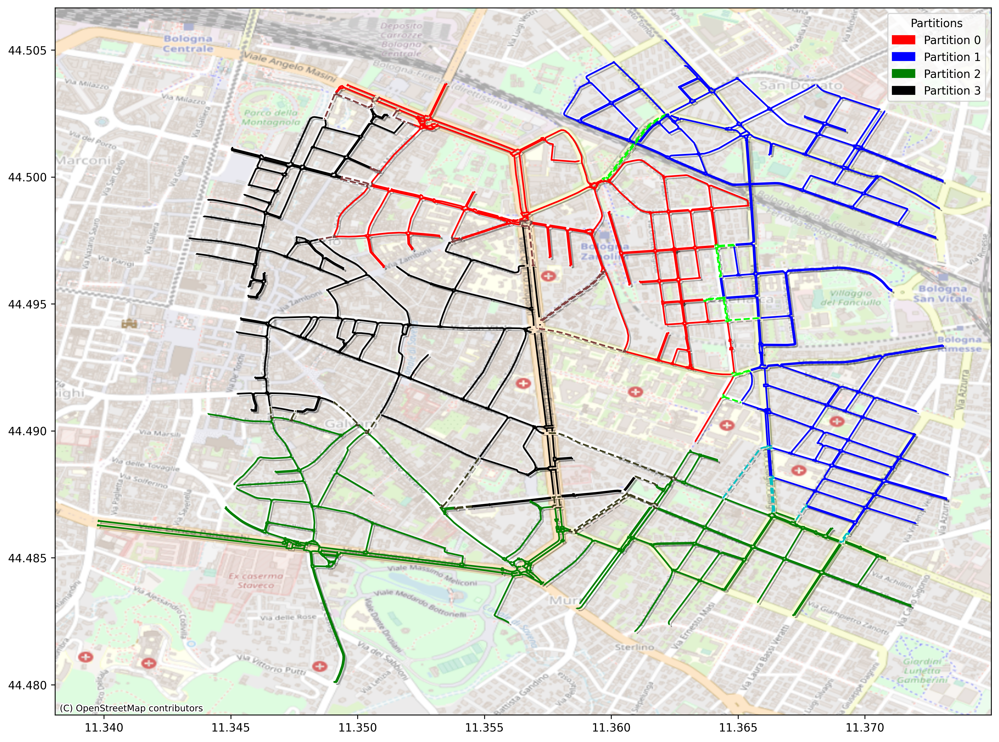

In [9]:
# from urllib.parse import quote

# with open(results_file, 'r') as f:
#     content = f.read()
#     content = content.replace('"./', f'"{quote(seldir)}/')
    # display(HTML(content))
    
Image(os.path.join(seldir, "partitions.png"))

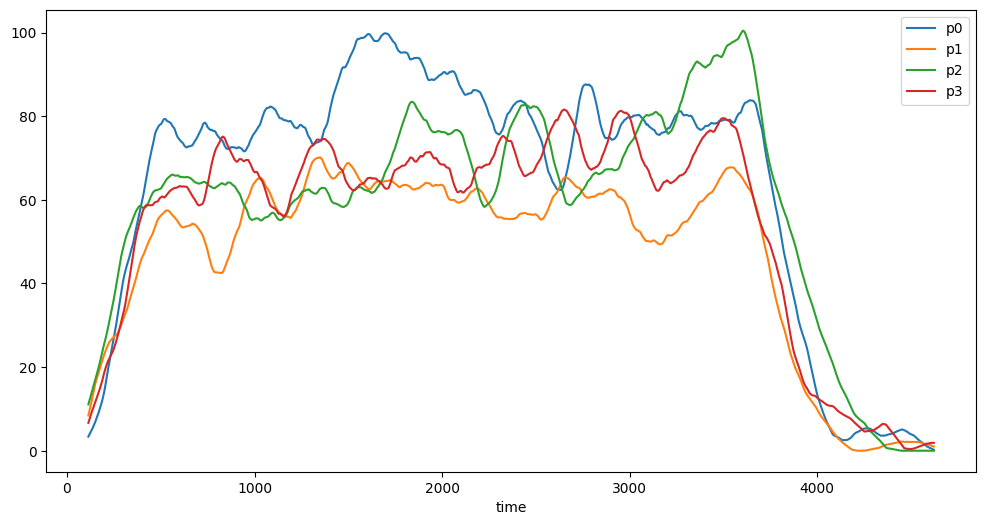

In [10]:
display(Image(os.path.join(seldir, "allStepVehicles.png")))

In [11]:
# test_dir = os.path.join("testResults", get_last_testdir())
# subdirs = [f for f in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, f))]
# dirname = subdirs[0]
# dirpath = os.path.join(test_dir, dirname)

# msgnum_df = pd.read_csv(os.path.join(dirpath, "msgNum.csv"), index_col="time")
# msgnum_df_in = msgnum_df[filter(lambda x: x.endswith("_in"), msgnum_df.columns)].rename(columns=lambda x: x.replace("_in", ""))
# msgnum_df_out = msgnum_df[filter(lambda x: x.endswith("_out"), msgnum_df.columns)].rename(columns=lambda x: x.replace("_out", ""))
# msgnum_df_tot = msgnum_df_in + msgnum_df_out
# avg_devtn_msgnum = msgnum_df.std(axis=1)

# msgnum_df_in.sum()